# Telecom Churn Prediction

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/b/b9/CRISP-DM_Process_Diagram.png/639px-CRISP-DM_Process_Diagram.png" style="height: 400px; width:400px;"/>

After Business and Data Understanding via EDA, we want to prepare data for modelling. Then evaluate and submit our predictions.

# 0. Problem statement

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business
goal. To reduce customer churn, telecom companies need to predict which customers are at high risk of churn. In this project, you will analyze customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn, and identify the main indicators of churn.

In this module, our goal is *to build a machine learning model that is able to predict churning customers based on the features provided for their usage.*

**Customer behaviour during churn:**

Customers usually do not decide to switch to another competitor instantly, but rather over a
period of time (this is especially applicable to high-value customers). In churn prediction, we
assume that there are three phases of customer lifecycle :

1. <u>The ‘good’ phase:</u> In this phase, the customer is happy with the service and behaves as usual.

2. <u>The ‘action’ phase:</u> The customer experience starts to sore in this phase, for e.g. he/she gets a compelling offer from a competitor, faces unjust charges, becomes unhappy with service quality etc. In this phase, the customer usually shows different behaviour than the ‘good’ months. It is crucial to identify high-churn-risk customers in this phase, since some corrective actions can be taken at this point (such as matching the competitor’s offer/improving the service quality etc.)

3. <u>The ‘churn’ phase:</u> In this phase, the customer is said to have churned. In this case, since you are working over a four-month window, the first two months are the ‘good’ phase, the third month is the ‘action’ phase, while the fourth month (September) is the ‘churn’ phase.

# 1. Loading dependencies & datasets & Exploration

Lets start by loading our dependencies. We can keep adding any imports to this cell block, as we write mode and mode code.

In [1]:
# #Data Structures
# import pandas as pd
# import numpy as np
# import re
# import os

# ### For installing missingno library, type this command in terminal
# #pip install missingno

# import missingno as msno

# #Sklearn
# from sklearn.impute import SimpleImputer
# from sklearn.preprocessing import StandardScaler
# from sklearn.model_selection import train_test_split
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.decomposition import PCA
# from sklearn.manifold import TSNE
# from sklearn.linear_model import LogisticRegression
# from sklearn.pipeline import Pipeline
# from sklearn.model_selection import GridSearchCV
# from sklearn.metrics import confusion_matrix, precision_score, recall_score

# #Plotting
# import matplotlib.pyplot as plt
# from mpl_toolkits.mplot3d import Axes3D
# import seaborn as sns

# #Others
# import warnings
# warnings.filterwarnings('ignore')

# import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import matplotlib.patches as patches
%matplotlib inline
import seaborn as sb
import traceback
import math
import datetime

In [2]:
#Reading Train data
metadataTrainDF = pd.read_csv('data_dictionary.csv')
trainDF = pd.read_csv('train.csv', delimiter = ',')

In [3]:
#Inspecting metaDate
metadataTrainDF.style

,Acronyms,Description
0,CIRCLE_ID,Telecom circle area to which the customer belongs to
1,LOC,Local calls within same telecom circle
2,STD,STD calls outside the calling circle
3,IC,Incoming calls
4,OG,Outgoing calls
5,T2T,Operator T to T ie within same operator mobile to mobile
6,T2M,Operator T to other operator mobile
7,T2O,Operator T to other operator fixed line
8,T2F,Operator T to fixed lines of T
9,T2C,Operator T to its own call center


In [4]:
#Cheking size if training data
trainDF.shape

(69999, 172)

In [5]:
#Visualising Date
trainDF.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,...,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,...,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,...,0,0,NaN,1.0,NaN,710,0.0,0.0,0.0,0
2,2,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,60.806,103.176,...,0,0,NaN,NaN,NaN,882,0.0,0.0,0.0,0
3,3,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,156.362,205.260,...,0,0,NaN,NaN,NaN,982,0.0,0.0,0.0,0
4,4,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,240.708,128.191,...,1,0,1.0,1.0,1.0,647,0.0,0.0,0.0,0


In [6]:
#Checking columns of data
trainDF.columns

Index(['id', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou',
       'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'arpu_6', 'arpu_7',
       ...
       'sachet_3g_7', 'sachet_3g_8', 'fb_user_6', 'fb_user_7', 'fb_user_8',
       'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'churn_probability'],
      dtype='object', length=172)

In [7]:
#Describe the data
trainDF.describe()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,...,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,69999.000000,69999.0,69297.0,69297.0,69297.0,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,...,69999.000000,69999.000000,17568.000000,17865.000000,18417.000000,69999.000000,69999.000000,69999.000000,69999.00000,69999.000000
mean,34999.000000,109.0,0.0,0.0,0.0,283.134365,278.185912,278.858826,133.153275,133.894438,...,0.081444,0.085487,0.916325,0.909544,0.890319,1220.639709,68.108597,65.935830,60.07674,0.101887
std,20207.115084,0.0,0.0,0.0,0.0,334.213918,344.366927,351.924315,299.963093,311.277193,...,0.634547,0.680035,0.276907,0.286842,0.312501,952.426321,269.328659,267.899034,257.22681,0.302502
min,0.000000,109.0,0.0,0.0,0.0,-2258.709000,-1289.715000,-945.808000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.00000,0.000000
25%,17499.500000,109.0,0.0,0.0,0.0,93.581000,86.714000,84.095000,7.410000,6.675000,...,0.000000,0.000000,1.000000,1.000000,1.000000,468.000000,0.000000,0.000000,0.00000,0.000000
50%,34999.000000,109.0,0.0,0.0,0.0,197.484000,191.588000,192.234000,34.110000,32.280000,...,0.000000,0.000000,1.000000,1.000000,1.000000,868.000000,0.000000,0.000000,0.00000,0.000000
75%,52498.500000,109.0,0.0,0.0,0.0,370.791000,365.369500,369.909000,119.390000,115.837500,...,0.000000,0.000000,1.000000,1.000000,1.000000,1813.000000,0.000000,0.000000,0.00000,0.000000
max,69998.000000,109.0,0.0,0.0,0.0,27731.088000,35145.834000,33543.624000,7376.710000,8157.780000,...,33.000000,41.000000,1.000000,1.000000,1.000000,4337.000000,12916.220000,9165.600000,11166.21000,1.000000


In [8]:
trainDF.isna().sum()

id                     0
circle_id              0
loc_og_t2o_mou       702
std_og_t2o_mou       702
loc_ic_t2o_mou       702
                    ... 
aon                    0
aug_vbc_3g             0
jul_vbc_3g             0
jun_vbc_3g             0
churn_probability      0
Length: 172, dtype: int64

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [10]:
#For further analysis, Lets categories the columns.
# - Id/Primary Keys
# - Date Columns
# - Users type

idColumns = ["id",'circle_id']

dateColumns = ['last_date_of_month_6'
               ,'last_date_of_month_7'
               ,'last_date_of_month_8'
               ,'date_of_last_rech_6'
               ,'date_of_last_rech_7'
               ,'date_of_last_rech_8'
               ,'date_of_last_rech_data_6'
               ,'date_of_last_rech_data_7'
               ,'date_of_last_rech_data_8']


CategoryColumns =  ['night_pck_user_6'
                    ,'night_pck_user_7'
                    ,'night_pck_user_8'
                    ,'fb_user_6'
                    ,'fb_user_7'
                    ,'fb_user_8']

numericColumns = [column for column in trainDF.columns if column not in idColumns + dateColumns + CategoryColumns]


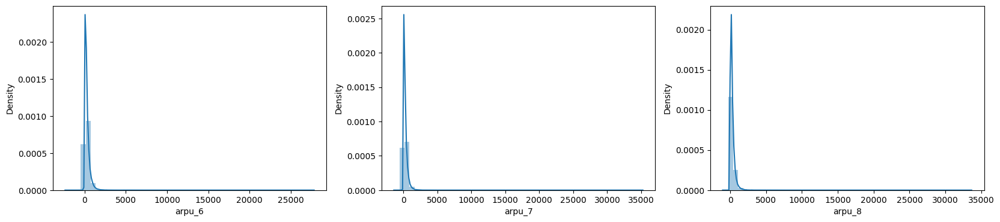

In [11]:
#Check the distribution of the data

plt.figure(figsize=(20, 4))
plt.subplot(1,3,1)
sns.distplot(trainDF['arpu_6'])
plt.subplot(1,3,2)
sns.distplot(trainDF['arpu_7'])
plt.subplot(1,3,3)
sns.distplot(trainDF['arpu_8']);

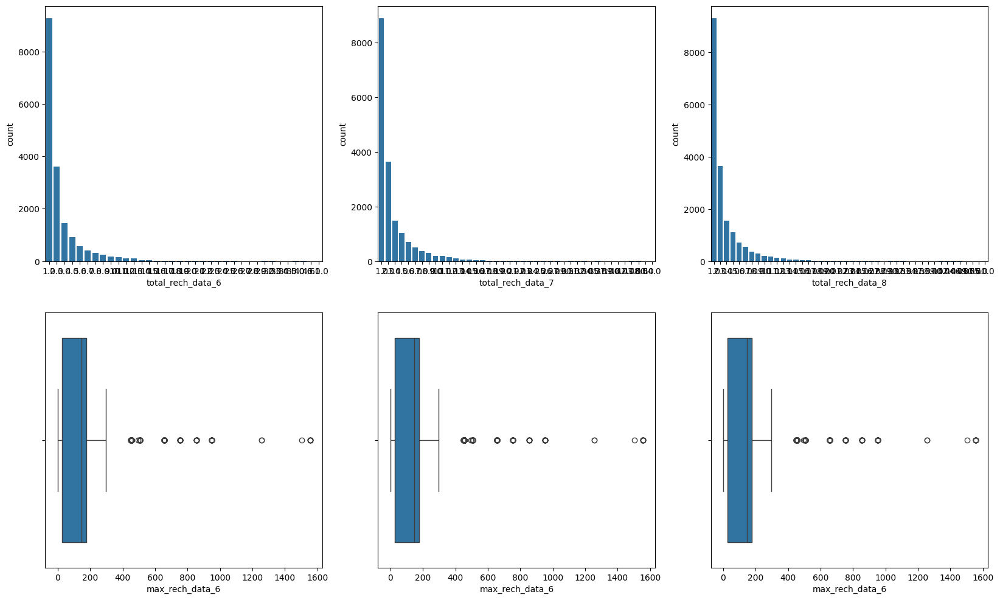

In [12]:
#Check the distribution of the data

plt.figure(figsize=(20, 12))
#sb.set_style("darkgrid")
#sb.set_palette(palette = 'colorblind', n_colors = 10, desat = 0.8)
#current_palette = sb.color_palette()

plt.subplot(2,3,1)
sns.countplot(x = 'total_rech_data_6', data = trainDF)
plt.subplot(2,3,2)
sns.countplot(x = 'total_rech_data_7',  data = trainDF)
plt.subplot(2,3,3)
sns.countplot(x = 'total_rech_data_8', data = trainDF)
plt.subplot(2,3,4)
sns.boxplot(x = 'max_rech_data_6', data = trainDF)
plt.subplot(2,3,5)
sns.boxplot(x = 'max_rech_data_6',  data = trainDF)
plt.subplot(2,3,6)
sns.boxplot(x = 'max_rech_data_6', data = trainDF)
plt.show();

## Data Manipulation

In [13]:
#Taking backup
telecomData = trainDF.copy(deep=True)

In [14]:
#Handle missing value
telecomData.isnull().sum()*100/telecomData.shape[0]

id                   0.000000
circle_id            0.000000
loc_og_t2o_mou       1.002871
std_og_t2o_mou       1.002871
loc_ic_t2o_mou       1.002871
                       ...   
aon                  0.000000
aug_vbc_3g           0.000000
jul_vbc_3g           0.000000
jun_vbc_3g           0.000000
churn_probability    0.000000
Length: 172, dtype: float64

In [15]:
# Imputing missing values
rechargeColumns = ['total_rech_data_6', 
                   'total_rech_data_7', 
                   'total_rech_data_8',
                   'count_rech_2g_6', 
                   'count_rech_2g_7', 
                   'count_rech_2g_8',
                   'count_rech_3g_6', 
                   'count_rech_3g_7', 
                   'count_rech_3g_8',
                   'max_rech_data_6', 
                   'max_rech_data_7', 
                   'max_rech_data_8',
                   'av_rech_amt_data_6', 
                   'av_rech_amt_data_7', 
                   'av_rech_amt_data_8',
                 ]

telecomData[rechargeColumns].describe(include='all')

,total_rech_data_6,total_rech_data_7,total_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8
count,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000
mean,2.467612,2.679989,2.652441,1.865323,2.056311,2.016018,0.602288,0.623678,0.636423,126.500000,126.402071,125.374925,192.831096,201.455940,196.815792
std,2.794610,3.073472,3.101265,2.566377,2.799916,2.728246,1.279297,1.401230,1.457058,109.352573,109.459266,109.648799,190.623115,198.346141,192.280532
min,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,25.000000,25.000000,25.000000,82.000000,92.000000,84.000000
50%,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,145.000000,145.000000,145.000000,154.000000,154.000000,154.000000
75%,3.000000,3.000000,3.000000,2.000000,2.000000,2.000000,1.000000,1.000000,1.000000,177.000000,177.000000,179.000000,252.000000,252.000000,252.000000
max,61.000000,54.000000,60.000000,42.000000,48.000000,44.000000,29.000000,34.000000,45.000000,1555.000000,1555.000000,1555.000000,5920.000000,4365.000000,4076.000000


In [16]:
# In case customer is not doing regarding then NAN value is populated.
# Imputing the NaN columns to zero.

columsWithNaN = ['total_rech_data_6', 
                 'total_rech_data_7', 
                 'total_rech_data_8',
                 'av_rech_amt_data_6', 
                 'av_rech_amt_data_7', 
                 'av_rech_amt_data_8', 
                 'max_rech_data_6', 
                 'max_rech_data_7', 
                 'max_rech_data_8']

telecomData[columsWithNaN] = telecomData[columsWithNaN].apply(lambda x: x.fillna(0))

In [17]:
# Lets validate the data
print(telecomData[columsWithNaN].isnull().sum()*100/telecomData.shape[1])

total_rech_data_6     0.0
total_rech_data_7     0.0
total_rech_data_8     0.0
av_rech_amt_data_6    0.0
av_rech_amt_data_7    0.0
av_rech_amt_data_8    0.0
max_rech_data_6       0.0
max_rech_data_7       0.0
max_rech_data_8       0.0
dtype: float64


## Droping columns

In [18]:
# Since the ID and date columns does impact on behavius, 
# so we can drop them.

telecomData = telecomData.drop(idColumns + dateColumns, axis=1)
telecomData.shape

# columns droped from 172 to 161

(69999, 161)

## Imputing categorical columns

In [19]:
telecomData[CategoryColumns] = telecomData[CategoryColumns].apply(lambda x: x.fillna(-1))


In [20]:
print(telecomData[CategoryColumns].isnull().sum()*100/telecomData.shape[0])

night_pck_user_6    0.0
night_pck_user_7    0.0
night_pck_user_8    0.0
fb_user_6           0.0
fb_user_7           0.0
fb_user_8           0.0
dtype: float64


In [21]:
# Columns has more then 70% of the data as null then,
# as per cleaning process those columns should be dropped.

include_cols = list(telecomData.apply(lambda column: True if column.isnull().sum()/telecomData.shape[0] < 0.7 else False))
telecomData = telecomData.loc[:, include_cols]

In [22]:
telecomData.shape

(69999, 149)

### Droping the columns with same values


In [23]:
#Droping the columns as they have same values
columnsToDrop = ["loc_og_t2o_mou","std_og_t2o_mou","loc_ic_t2o_mou"]
telecomData = telecomData.drop(columnsToDrop, axis=1)

In [24]:
nanVaribaleList = telecomData.columns[telecomData.isna().any()].tolist()
for i in nanVaribaleList:    
    telecomData[i] = telecomData[i].fillna(0)

## Data Tranformation

In [25]:
# Calculate the total rechage 
telecomData['total_data_rech_6'] = telecomData['total_rech_data_6'] * telecomData['av_rech_amt_data_6']
telecomData['total_data_rech_7'] = telecomData['total_rech_data_7'] * telecomData['av_rech_amt_data_7']

In [26]:
# calculate total recharge amount for June and July
telecomData['amt_data_6'] = telecomData['total_rech_amt_6'] + telecomData['total_data_rech_6']
telecomData['amt_data_7'] = telecomData['total_rech_amt_7'] + telecomData['total_data_rech_7']

In [27]:
# calculate average recharge done by customer in June and July
telecomData['av_amt_data_6_7'] = (telecomData['amt_data_6'] + telecomData['amt_data_7'])/2

In [28]:
# look at the 70th percentile recharge amount
print(telecomData['av_amt_data_6_7'].quantile(0.7))

# Looks like 70% of reachage amount is 477, Lets focus on this area.

477.5


In [29]:
# retain only those customers who have recharged their mobiles with more than or equal to 70th percentile amount
telecomDatafiltered = telecomData.loc[telecomData.av_amt_data_6_7 >= telecomData.av_amt_data_6_7.quantile(0.7), :]
telecomDatafiltered = telecomDatafiltered.reset_index(drop=True)
telecomDatafiltered.shape

(21013, 151)

In [30]:
# delete variables created to filter high-value customers
telecomDatafiltered = telecomDatafiltered.drop(['total_data_rech_6', 'total_data_rech_7','amt_data_6', 'amt_data_7', 'av_amt_data_6_7'], axis=1)
telecomDatafiltered.shape

(21013, 146)

In [31]:
# Creating columns to check the difference in 8th month

telecomDatafiltered['arpu_diff'] = telecomDatafiltered.arpu_8 - ((telecomDatafiltered.arpu_6 + telecomDatafiltered.arpu_7)/2)
telecomDatafiltered['onnet_mou_diff'] = telecomDatafiltered.onnet_mou_8 - ((telecomDatafiltered.onnet_mou_6 + telecomDatafiltered.onnet_mou_7)/2)
telecomDatafiltered['offnet_mou_diff'] = telecomDatafiltered.offnet_mou_8 - ((telecomDatafiltered.offnet_mou_6 + telecomDatafiltered.offnet_mou_7)/2)
telecomDatafiltered['roam_ic_mou_diff'] = telecomDatafiltered.roam_ic_mou_8 - ((telecomDatafiltered.roam_ic_mou_6 + telecomDatafiltered.roam_ic_mou_7)/2)
telecomDatafiltered['roam_og_mou_diff'] = telecomDatafiltered.roam_og_mou_8 - ((telecomDatafiltered.roam_og_mou_6 + telecomDatafiltered.roam_og_mou_7)/2)
telecomDatafiltered['loc_og_mou_diff'] = telecomDatafiltered.loc_og_mou_8 - ((telecomDatafiltered.loc_og_mou_6 + telecomDatafiltered.loc_og_mou_7)/2)
telecomDatafiltered['std_og_mou_diff'] = telecomDatafiltered.std_og_mou_8 - ((telecomDatafiltered.std_og_mou_6 + telecomDatafiltered.std_og_mou_7)/2)
telecomDatafiltered['isd_og_mou_diff'] = telecomDatafiltered.isd_og_mou_8 - ((telecomDatafiltered.isd_og_mou_6 + telecomDatafiltered.isd_og_mou_7)/2)
telecomDatafiltered['spl_og_mou_diff'] = telecomDatafiltered.spl_og_mou_8 - ((telecomDatafiltered.spl_og_mou_6 + telecomDatafiltered.spl_og_mou_7)/2)
telecomDatafiltered['total_og_mou_diff'] = telecomDatafiltered.total_og_mou_8 - ((telecomDatafiltered.total_og_mou_6 + telecomDatafiltered.total_og_mou_7)/2)
telecomDatafiltered['loc_ic_mou_diff'] = telecomDatafiltered.loc_ic_mou_8 - ((telecomDatafiltered.loc_ic_mou_6 + telecomDatafiltered.loc_ic_mou_7)/2)
telecomDatafiltered['std_ic_mou_diff'] = telecomDatafiltered.std_ic_mou_8 - ((telecomDatafiltered.std_ic_mou_6 + telecomDatafiltered.std_ic_mou_7)/2)
telecomDatafiltered['isd_ic_mou_diff'] = telecomDatafiltered.isd_ic_mou_8 - ((telecomDatafiltered.isd_ic_mou_6 + telecomDatafiltered.isd_ic_mou_7)/2)
telecomDatafiltered['spl_ic_mou_diff'] = telecomDatafiltered.spl_ic_mou_8 - ((telecomDatafiltered.spl_ic_mou_6 + telecomDatafiltered.spl_ic_mou_7)/2)
telecomDatafiltered['total_ic_mou_diff'] = telecomDatafiltered.total_ic_mou_8 - ((telecomDatafiltered.total_ic_mou_6 + telecomDatafiltered.total_ic_mou_7)/2)
telecomDatafiltered['total_rech_num_diff'] = telecomDatafiltered.total_rech_num_8 - ((telecomDatafiltered.total_rech_num_6 + telecomDatafiltered.total_rech_num_7)/2)
telecomDatafiltered['total_rech_amt_diff'] = telecomDatafiltered.total_rech_amt_8 - ((telecomDatafiltered.total_rech_amt_6 + telecomDatafiltered.total_rech_amt_7)/2)
telecomDatafiltered['max_rech_amt_diff'] = telecomDatafiltered.max_rech_amt_8 - ((telecomDatafiltered.max_rech_amt_6 + telecomDatafiltered.max_rech_amt_7)/2)
telecomDatafiltered['total_rech_data_diff'] = telecomDatafiltered.total_rech_data_8 - ((telecomDatafiltered.total_rech_data_6 + telecomDatafiltered.total_rech_data_7)/2)
telecomDatafiltered['max_rech_data_diff'] = telecomDatafiltered.max_rech_data_8 - ((telecomDatafiltered.max_rech_data_6 + telecomDatafiltered.max_rech_data_7)/2)
telecomDatafiltered['av_rech_amt_data_diff'] = telecomDatafiltered.av_rech_amt_data_8 - ((telecomDatafiltered.av_rech_amt_data_6 + telecomDatafiltered.av_rech_amt_data_7)/2)
telecomDatafiltered['vol_2g_mb_diff'] = telecomDatafiltered.vol_2g_mb_8 - ((telecomDatafiltered.vol_2g_mb_6 + telecomDatafiltered.vol_2g_mb_7)/2)
telecomDatafiltered['vol_3g_mb_diff'] = telecomDatafiltered.vol_3g_mb_8 - ((telecomDatafiltered.vol_3g_mb_6 + telecomDatafiltered.vol_3g_mb_7)/2)

In [32]:
num_cols = [column for column in telecomDatafiltered.columns if column not in CategoryColumns]
len(num_cols)

163

### Univariate Analysis

count    69999.000000
mean       283.134365
std        334.213918
min      -2258.709000
25%         93.581000
50%        197.484000
75%        370.791000
max      27731.088000
Name: arpu_6, dtype: float64


<Axes: xlabel='arpu_6', ylabel='Density'>

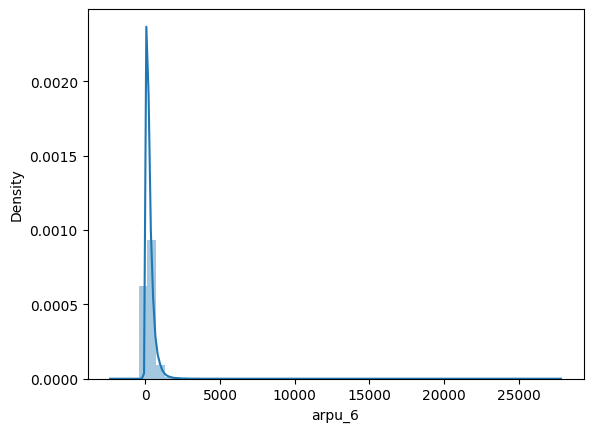

In [33]:
variableName = telecomData['arpu_6']
print(variableName.describe())
sns.distplot(variableName)

count    69999.000000
mean       278.185912
std        344.366927
min      -1289.715000
25%         86.714000
50%        191.588000
75%        365.369500
max      35145.834000
Name: arpu_7, dtype: float64


<Axes: xlabel='arpu_7', ylabel='Density'>

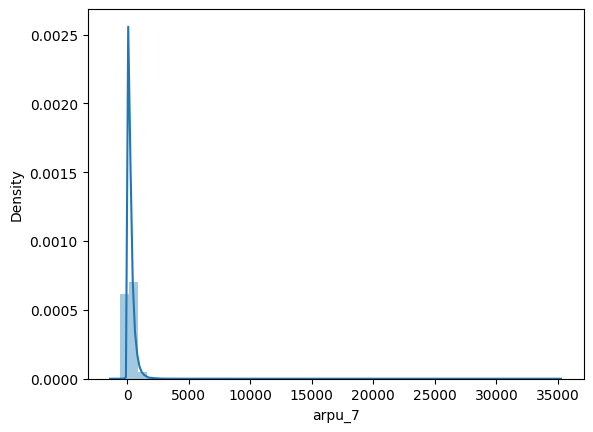

In [34]:
variableName = telecomData['arpu_7']
print(variableName.describe())
sns.distplot(variableName)

count    69999.000000
mean       125.943607
std        304.990552
min          0.000000
25%          4.110000
50%         27.840000
75%        106.280000
max      10752.560000
Name: onnet_mou_8, dtype: float64


<Axes: xlabel='onnet_mou_8', ylabel='Density'>

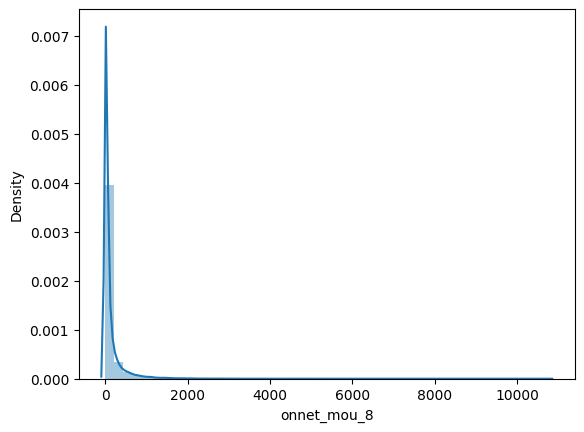

In [35]:
variableName = telecomData['onnet_mou_8']
print(variableName.describe())
sns.distplot(variableName)

### Bivariate Analysis

In [36]:
telecomDatafiltered.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
0,240.708,128.191,101.565,21.28,4.83,6.13,56.99,38.11,9.63,53.64,...,0.000,12.860,-3.5,-91.0,-15.5,-1.0,-8.0,-41.0,-136.375,0.00
1,580.549,377.294,338.286,10.43,24.99,194.43,317.11,341.79,197.09,0.00,...,0.000,124.655,0.0,125.0,0.0,0.5,77.0,77.0,224.140,0.00
2,1130.948,905.506,479.762,859.53,372.71,0.89,293.46,450.11,386.91,0.00,...,-0.065,-320.160,-12.5,-711.0,34.0,0.0,0.0,0.0,0.000,0.00
3,371.974,352.069,240.449,93.18,38.29,29.86,531.19,507.76,222.03,0.00,...,0.000,0.080,3.0,-193.5,-80.0,-0.5,0.0,-11.5,-0.020,0.00
4,390.489,350.985,421.300,8.58,11.48,12.68,133.16,158.73,182.83,0.00,...,0.000,26.105,-6.5,-318.5,-13.0,0.0,11.0,-40.5,-38.920,1017.89


<Axes: xlabel='arpu_6', ylabel='onnet_mou_6'>

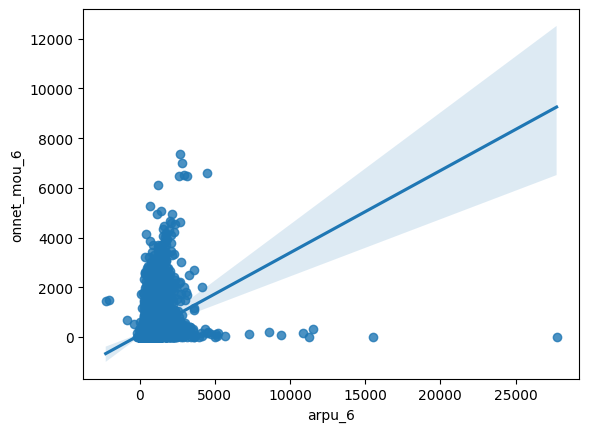

In [37]:
variable1 = telecomDatafiltered.arpu_6
variable2 = telecomDatafiltered.onnet_mou_6
sns.regplot(x= variable1, y = variable2)

<Axes: xlabel='arpu_7', ylabel='onnet_mou_7'>

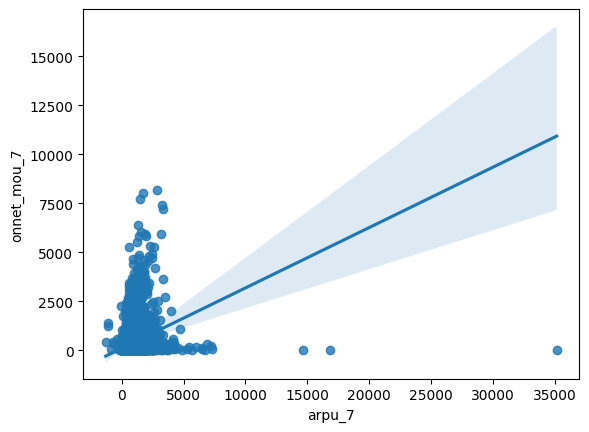

In [38]:
variable1 = telecomDatafiltered.arpu_7
variable2 = telecomDatafiltered.onnet_mou_7
sns.regplot(x= variable1, y = variable2)

<Axes: xlabel='max_rech_data_diff', ylabel='vol_3g_mb_diff'>

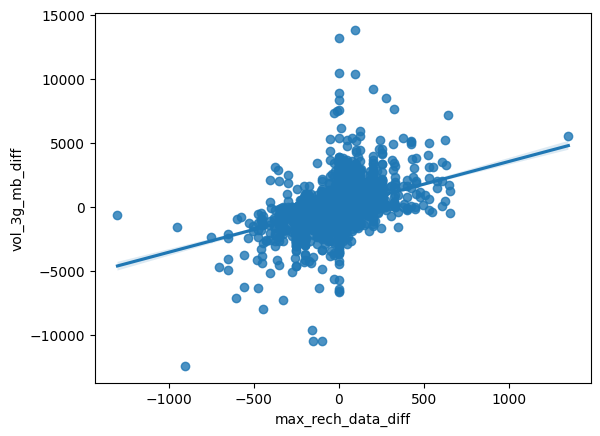

In [39]:
variable1 = telecomDatafiltered.max_rech_data_diff
variable2 = telecomDatafiltered.vol_3g_mb_diff
sns.regplot(x= variable1, y = variable2)

### Outlier treatment

In [40]:
def capOutliers(array, k=3):
    upperLimit = array.mean() + k*array.std()
    lowerLimit = array.mean() - k*array.std()
    array[array<lowerLimit] = lowerLimit
    array[array>upperLimit] = upperLimit
    return array

In [41]:
# cap outliers in the numeric columns
telecomDatafiltered[num_cols] = telecomDatafiltered[num_cols].apply(capOutliers, axis=0)

In [42]:
telecomDatafiltered.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
0,240.708,128.191,101.565,21.28,4.83,6.13,56.99,38.11,9.63,53.64,...,0.000,12.860,-3.5,-91.0,-15.5,-1.0,-8.0,-41.0,-136.375,0.00
1,580.549,377.294,338.286,10.43,24.99,194.43,317.11,341.79,197.09,0.00,...,0.000,124.655,0.0,125.0,0.0,0.5,77.0,77.0,224.140,0.00
2,1130.948,905.506,479.762,859.53,372.71,0.89,293.46,450.11,386.91,0.00,...,-0.065,-320.160,-12.5,-711.0,34.0,0.0,0.0,0.0,0.000,0.00
3,371.974,352.069,240.449,93.18,38.29,29.86,531.19,507.76,222.03,0.00,...,0.000,0.080,3.0,-193.5,-80.0,-0.5,0.0,-11.5,-0.020,0.00
4,390.489,350.985,421.300,8.58,11.48,12.68,133.16,158.73,182.83,0.00,...,0.000,26.105,-6.5,-318.5,-13.0,0.0,11.0,-40.5,-38.920,1017.89


### Creating correlations

In [43]:
telecomNumbericDate = telecomDatafiltered[num_cols]
correlation = telecomNumbericDate.corr()
correlation

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
arpu_6,1.000000,0.586362,0.501452,0.430119,0.279857,0.248881,0.597043,0.391466,0.345670,0.161524,...,-0.020918,-0.118421,-0.214080,-0.281766,-0.044233,0.048640,-0.004060,-0.002464,0.025108,-0.045151
arpu_7,0.586362,1.000000,0.690120,0.282407,0.419770,0.361100,0.401375,0.574563,0.478608,0.136504,...,-0.006689,0.011345,-0.021199,-0.058084,0.062313,0.079665,0.041971,0.034692,0.055187,0.018964
arpu_8,0.501452,0.690120,1.000000,0.200814,0.299652,0.453203,0.315521,0.439337,0.624135,0.132482,...,0.012530,0.196034,0.349514,0.473184,0.265941,0.213139,0.219765,0.272121,0.112700,0.184229
onnet_mou_6,0.430119,0.282407,0.200814,1.000000,0.779622,0.663355,0.116079,0.064316,0.063291,0.034440,...,-0.037531,-0.067139,-0.126481,-0.159292,0.007603,0.052274,0.040704,0.049691,0.040981,0.019481
onnet_mou_7,0.279857,0.419770,0.299652,0.779622,1.000000,0.816120,0.063987,0.111920,0.103502,0.057619,...,-0.046611,0.002737,-0.025058,-0.036378,0.056736,0.066212,0.047225,0.060206,0.051115,0.027161
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
total_rech_data_diff,0.048640,0.079665,0.213139,0.052274,0.066212,0.080085,0.085461,0.092335,0.109554,0.038162,...,0.015885,0.050462,0.391073,0.187262,0.073136,1.000000,0.224628,0.570444,0.242772,0.281984
max_rech_data_diff,-0.004060,0.041971,0.219765,0.040704,0.047225,0.058654,0.055573,0.064888,0.082442,0.012810,...,0.022153,0.044678,0.086772,0.258100,0.375260,0.224628,1.000000,0.702422,0.266951,0.456058
av_rech_amt_data_diff,-0.002464,0.034692,0.272121,0.049691,0.060206,0.069457,0.075034,0.082796,0.100157,0.031745,...,0.021371,0.042880,0.211268,0.328750,0.274306,0.570444,0.702422,1.000000,0.242432,0.587969
vol_2g_mb_diff,0.025108,0.055187,0.112700,0.040981,0.051115,0.054523,0.052383,0.059541,0.058895,-0.002067,...,0.014203,0.012609,0.098095,0.091464,0.099001,0.242772,0.266951,0.242432,1.000000,-0.073887


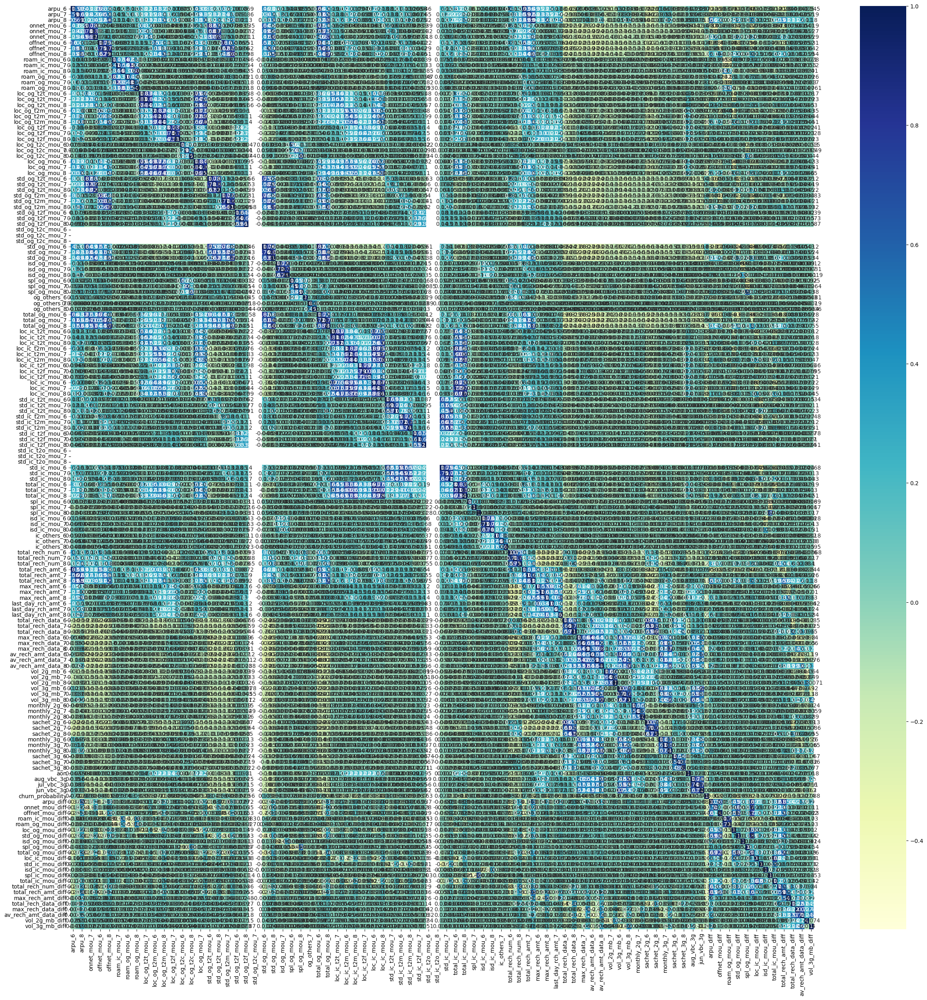

In [44]:
plt.figure(figsize = (30, 30))
sns.heatmap(correlation, annot = True, cmap="YlGnBu")
plt.show();

## Model building

In [45]:
# import required libraries
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import FeatureUnion
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC

In [46]:
telecomDatafiltered['churn_probability'] = pd.to_numeric(telecomDatafiltered['churn_probability'])

In [47]:
X = telecomDatafiltered.drop("churn_probability", axis = 1)
y = telecomDatafiltered['churn_probability']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 4, stratify = y)

In [48]:
X_train.shape, y_train.shape

((15759, 168), (15759,))

In [49]:
X_test.shape, y_test.shape

((5254, 168), (5254,))

In [50]:
# aggregate the categorical columns
train = pd.concat([X_train, y_train], axis=1)

In [51]:
train.groupby('night_pck_user_6').churn_probability.mean(), \
train.groupby('night_pck_user_7').churn_probability.mean(), \
train.groupby('night_pck_user_8').churn_probability.mean()

(night_pck_user_6
 -1.0    0.091037
  0.0    0.061534
  1.0    0.110355
 Name: churn_probability, dtype: float64,
 night_pck_user_7
 -1.0    0.106008
  0.0    0.051774
  1.0    0.049518
 Name: churn_probability, dtype: float64,
 night_pck_user_8
 -1.0    0.129077
  0.0    0.027976
  1.0    0.019661
 Name: churn_probability, dtype: float64)

In [52]:
train.groupby('fb_user_6').churn_probability.mean(), \
train.groupby('fb_user_7').churn_probability.mean(), \
train.groupby('fb_user_8').churn_probability.mean()

(fb_user_6
 -1.0    0.091037
  0.0    0.067671
  1.0    0.062284
 Name: churn_probability, dtype: float64,
 fb_user_7
 -1.0    0.106008
  0.0    0.059332
  1.0    0.051071
 Name: churn_probability, dtype: float64,
 fb_user_8
 -1.0    0.129077
  0.0    0.071381
  1.0    0.022682
 Name: churn_probability, dtype: float64)

In [53]:
mapping = {'night_pck_user_6' : {-1:  0.091037, 0: 0.061534, 1: 0.110355},
           'night_pck_user_7' : {-1: 0.106008, 0: 0.051774, 1: 0.049518},
           'night_pck_user_8' : {-1: 0.129077, 0: 0.027976, 1: 0.019661},
           'fb_user_6'        : {-1: 0.091037, 0: 0.067671, 1: 0.062284},
           'fb_user_7'        : {-1: 0.106008, 0: 0.059332, 1: 0.051071},
           'fb_user_8'        : {-1: 0.129077, 0: 0.071381, 1: 0.022682}
          }
X_train.replace(mapping, inplace = True)
X_test.replace(mapping, inplace = True)

In [54]:
cat_X_train = [col for col in CategoryColumns if col not in ['telchurn']]
X_train[cat_X_train].info()

<class 'pandas.core.frame.DataFrame'>
Index: 15759 entries, 13528 to 20561
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   night_pck_user_6  15759 non-null  float64
 1   night_pck_user_7  15759 non-null  float64
 2   night_pck_user_8  15759 non-null  float64
 3   fb_user_6         15759 non-null  float64
 4   fb_user_7         15759 non-null  float64
 5   fb_user_8         15759 non-null  float64
dtypes: float64(6)
memory usage: 861.8 KB


In [55]:
X_train.shape

(15759, 168)

## Principle Component Analysis (PCA)

In [56]:
pca = Pipeline([('scaler', StandardScaler()), ('pca', PCA())])
pca.fit(X_train)
churn_pca = pca.fit_transform(X_train)
pca = pca.named_steps['pca']

# look at explainded variance of PCA components
print(pd.Series(np.round(pca.explained_variance_ratio_.cumsum(), 4)*100))

0       11.58
1       21.06
2       26.97
3       31.94
4       35.97
        ...  
163    100.00
164    100.00
165    100.00
166    100.00
167    100.00
Length: 168, dtype: float64


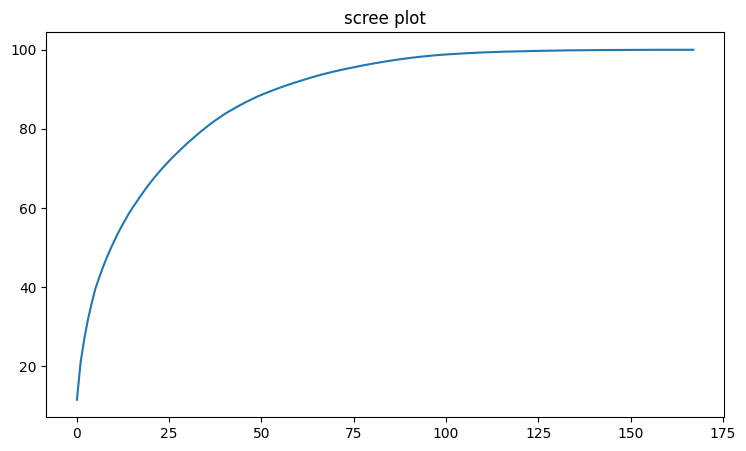

In [57]:
features = range(pca.n_components_)
cumulative_variance = np.round(np.cumsum(pca.explained_variance_ratio_)*100, decimals=4)

# 100 elements on y-axis; 175 elements on x-axis; 20 is normalising factor
plt.figure(figsize=(175/20,100/20)) 
plt.plot(cumulative_variance)
plt.title('scree plot');

## PCA and Logistic Regression

In [58]:
PCA_VARS = 60
steps = [('scaler', StandardScaler()),
         ("pca", PCA(n_components=PCA_VARS)),
         ("logistic", LogisticRegression(class_weight='balanced'))
        ]
pipeline = Pipeline(steps)

In [59]:
y_train=y_train.round()
pipeline.fit(X_train, y_train)

# check score on train data
pipeline.score(X_train, y_train)

0.8242908814011042

In [60]:
X_train.shape

(15759, 168)

### Test Data Evaluation

In [61]:
y_test=y_test.round()
y_pred = pipeline.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

# check sensitivity and specificity
# sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
# print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

# check area under curve
y_pred_prob = pipeline.predict_proba(X_test)[:, 1]
print("AUC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

[[3925  894]
 [  79  356]]
AUC:    	 0.89


In [62]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.98      0.81      0.89      4819
         1.0       0.28      0.82      0.42       435

    accuracy                           0.81      5254
   macro avg       0.63      0.82      0.66      5254
weighted avg       0.92      0.81      0.85      5254



### Hyperparameter Tuning

In [63]:
y_train.value_counts()/y_train.shape

churn_probability
0.0    0.917254
1.0    0.082746
Name: count, dtype: float64

In [64]:
# PCA
pca = PCA()

# logistic regression - the class weight is used to handle class imbalance - it adjusts the cost function
logistic = LogisticRegression(class_weight={0:0.1, 1: 0.9})

# create pipeline
steps = [("scaler", StandardScaler()), 
         ("pca", pca),
         ("logistic", logistic)
        ]

# compile pipeline
pca_logistic = Pipeline(steps)

# hyperparameter space
params = {'pca__n_components': [60, 80], 'logistic__C': [0.1, 0.5, 1, 2, 3, 4, 5, 10], 'logistic__penalty': ['l1', 'l2']}

# create 5 folds
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# create gridsearch object
model = GridSearchCV(estimator=pca_logistic, cv=folds, param_grid=params, scoring='roc_auc', n_jobs=-1, verbose=1)

In [65]:
# fit model
model.fit(X_train, y_train)

Fitting 5 folds for each of 32 candidates, totalling 160 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('pca', PCA()),
                                       ('logistic',
                                        LogisticRegression(class_weight={0: 0.1,
                                                                         1: 0.9}))]),
             n_jobs=-1,
             param_grid={'logistic__C': [0.1, 0.5, 1, 2, 3, 4, 5, 10],
                         'logistic__penalty': ['l1', 'l2'],
                         'pca__n_components': [60, 80]},
             scoring='roc_auc', verbose=1)

In [66]:
telchurn_result = pd.DataFrame(model.cv_results_) 

In [67]:
telchurn_result

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_logistic__C,param_logistic__penalty,param_pca__n_components,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,1.876771,1.021216,0.000000,0.000000,0.1,l1,60,"{'logistic__C': 0.1, 'logistic__penalty': 'l1'...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,17
1,2.195207,0.378464,0.000000,0.000000,0.1,l1,80,"{'logistic__C': 0.1, 'logistic__penalty': 'l1'...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,17
2,2.088854,0.217539,0.071883,0.008783,0.1,l2,60,"{'logistic__C': 0.1, 'logistic__penalty': 'l2'...",0.901377,0.894263,0.883384,0.899694,0.905001,0.896744,0.007523,16
3,3.134312,0.183401,0.072854,0.012395,0.1,l2,80,"{'logistic__C': 0.1, 'logistic__penalty': 'l2'...",0.900696,0.898326,0.886498,0.900767,0.905260,0.898310,0.006318,1
4,1.598802,0.218456,0.000000,0.000000,0.5,l1,60,"{'logistic__C': 0.5, 'logistic__penalty': 'l1'...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,17
5,2.111285,0.172319,0.000000,0.000000,0.5,l1,80,"{'logistic__C': 0.5, 'logistic__penalty': 'l1'...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,17
6,2.173714,0.123753,0.068566,0.009146,0.5,l2,60,"{'logistic__C': 0.5, 'logistic__penalty': 'l2'...",0.902083,0.894434,0.885520,0.900313,0.905040,0.897478,0.006909,12
7,2.938766,0.093010,0.074594,0.016560,0.5,l2,80,"{'logistic__C': 0.5, 'logistic__penalty': 'l2'...",0.900080,0.898623,0.885904,0.901044,0.905628,0.898256,0.006605,3
8,1.635449,0.257889,0.000000,0.000000,1,l1,60,"{'logistic__C': 1, 'logistic__penalty': 'l1', ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,17
9,2.127782,0.147408,0.000000,0.000000,1,l1,80,"{'logistic__C': 1, 'logistic__penalty': 'l1', ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,17


In [68]:
print("Best AUC: ", model.best_score_)
print("Best hyperparameters: ", model.best_params_)

Best AUC:  0.898309619281482
Best hyperparameters:  {'logistic__C': 0.1, 'logistic__penalty': 'l2', 'pca__n_components': 80}


In [69]:
# predict churn on test data
y_pred = model.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

# check sensitivity and specificity
# sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
# print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

# check area under curve
y_pred_prob = model.predict_proba(X_test)[:, 1]
print("AUC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

[[4081  738]
 [  86  349]]
AUC:    	 0.89


In [70]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.98      0.85      0.91      4819
         1.0       0.32      0.80      0.46       435

    accuracy                           0.84      5254
   macro avg       0.65      0.82      0.68      5254
weighted avg       0.92      0.84      0.87      5254



### Random Forest

In [71]:
# random forest - the class weight is used to handle class imbalance - it adjusts the cost function
forest = RandomForestClassifier(class_weight={0:0.1, 1: 0.9}, n_jobs = -1)

# hyperparameter space
params = {"criterion": ['gini', 'entropy'], "max_features": ['auto', 0.4]}

# create 5 folds
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# create gridsearch object
model = GridSearchCV(estimator=forest, cv=folds, param_grid=params, scoring='roc_auc', n_jobs=-1, verbose=1)

In [72]:
# fit model
model.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             estimator=RandomForestClassifier(class_weight={0: 0.1, 1: 0.9},
                                              n_jobs=-1),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_features': ['auto', 0.4]},
             scoring='roc_auc', verbose=1)

In [73]:
# print best hyperparameters
print("Best AUC: ", model.best_score_)
print("Best hyperparameters: ", model.best_params_)

Best AUC:  0.9275815831585223
Best hyperparameters:  {'criterion': 'entropy', 'max_features': 0.4}


In [74]:
y_pred = model.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

# check sensitivity and specificity

# check area under curve
y_pred_prob = model.predict_proba(X_test)[:, 1]
print("AUC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

[[4734   85]
 [ 231  204]]
AUC:    	 0.93


In [75]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.95      0.98      0.97      4819
         1.0       0.71      0.47      0.56       435

    accuracy                           0.94      5254
   macro avg       0.83      0.73      0.77      5254
weighted avg       0.93      0.94      0.93      5254



### Perfromace testing of external test file

In [76]:
X_test_sub = pd.read_csv("test.csv")
X_test_sub.shape
final_col=list(X_train.columns)
print(final_col)

['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'lo

In [77]:
adn_col =[]
for col in final_col:
    if col not in list(X_test_sub.columns):
        adn_col.append(col)
len(adn_col)

23

In [78]:
del_col =[]
for col in X_test_sub.columns:
    if col not in final_col:
        del_col.append(col)
X_test_sub = X_test_sub.drop(del_col, axis=1)

len(X_test_sub.columns)

145

In [79]:
X_test_sub['arpu_diff'] = X_test_sub.arpu_8 - ((X_test_sub.arpu_6 + X_test_sub.arpu_7)/2)
X_test_sub['onnet_mou_diff'] = X_test_sub.onnet_mou_8 - ((X_test_sub.onnet_mou_6 + X_test_sub.onnet_mou_7)/2)
X_test_sub['offnet_mou_diff'] = X_test_sub.offnet_mou_8 - ((X_test_sub.offnet_mou_6 + X_test_sub.offnet_mou_7)/2)
X_test_sub['roam_ic_mou_diff'] = X_test_sub.roam_ic_mou_8 - ((X_test_sub.roam_ic_mou_6 + X_test_sub.roam_ic_mou_7)/2)
X_test_sub['roam_og_mou_diff'] = X_test_sub.roam_og_mou_8 - ((X_test_sub.roam_og_mou_6 + X_test_sub.roam_og_mou_7)/2)
X_test_sub['loc_og_mou_diff'] = X_test_sub.loc_og_mou_8 - ((X_test_sub.loc_og_mou_6 + X_test_sub.loc_og_mou_7)/2)
X_test_sub['std_og_mou_diff'] = X_test_sub.std_og_mou_8 - ((X_test_sub.std_og_mou_6 + X_test_sub.std_og_mou_7)/2)
X_test_sub['isd_og_mou_diff'] = X_test_sub.isd_og_mou_8 - ((X_test_sub.isd_og_mou_6 + X_test_sub.isd_og_mou_7)/2)
X_test_sub['spl_og_mou_diff'] = X_test_sub.spl_og_mou_8 - ((X_test_sub.spl_og_mou_6 + X_test_sub.spl_og_mou_7)/2)
X_test_sub['total_og_mou_diff'] = X_test_sub.total_og_mou_8 - ((X_test_sub.total_og_mou_6 + X_test_sub.total_og_mou_7)/2)
X_test_sub['loc_ic_mou_diff'] = X_test_sub.loc_ic_mou_8 - ((X_test_sub.loc_ic_mou_6 + X_test_sub.loc_ic_mou_7)/2)
X_test_sub['std_ic_mou_diff'] = X_test_sub.std_ic_mou_8 - ((X_test_sub.std_ic_mou_6 + X_test_sub.std_ic_mou_7)/2)
X_test_sub['isd_ic_mou_diff'] = X_test_sub.isd_ic_mou_8 - ((X_test_sub.isd_ic_mou_6 + X_test_sub.isd_ic_mou_7)/2)
X_test_sub['spl_ic_mou_diff'] = X_test_sub.spl_ic_mou_8 - ((X_test_sub.spl_ic_mou_6 + X_test_sub.spl_ic_mou_7)/2)
X_test_sub['total_ic_mou_diff'] = X_test_sub.total_ic_mou_8 - ((X_test_sub.total_ic_mou_6 + X_test_sub.total_ic_mou_7)/2)
X_test_sub['total_rech_num_diff'] = X_test_sub.total_rech_num_8 - ((X_test_sub.total_rech_num_6 + X_test_sub.total_rech_num_7)/2)
X_test_sub['total_rech_amt_diff'] = X_test_sub.total_rech_amt_8 - ((X_test_sub.total_rech_amt_6 + X_test_sub.total_rech_amt_7)/2)
X_test_sub['max_rech_amt_diff'] = X_test_sub.max_rech_amt_8 - ((X_test_sub.max_rech_amt_6 + X_test_sub.max_rech_amt_7)/2)
X_test_sub['total_rech_data_diff'] = X_test_sub.total_rech_data_8 - ((X_test_sub.total_rech_data_6 + X_test_sub.total_rech_data_7)/2)
X_test_sub['max_rech_data_diff'] = X_test_sub.max_rech_data_8 - ((X_test_sub.max_rech_data_6 + X_test_sub.max_rech_data_7)/2)
X_test_sub['av_rech_amt_data_diff'] = X_test_sub.av_rech_amt_data_8 - ((X_test_sub.av_rech_amt_data_6 + X_test_sub.av_rech_amt_data_7)/2)
X_test_sub['vol_2g_mb_diff'] = X_test_sub.vol_2g_mb_8 - ((X_test_sub.vol_2g_mb_6 + X_test_sub.vol_2g_mb_7)/2)
X_test_sub['vol_3g_mb_diff'] = X_test_sub.vol_3g_mb_8 - ((X_test_sub.vol_3g_mb_6 + X_test_sub.vol_3g_mb_7)/2)

In [80]:
X_test_sub.shape

(30000, 168)

In [81]:
nan_test_list = X_test_sub.columns[X_test_sub.isna().any()].tolist()
for i in nan_test_list:
    X_test_sub[i] = X_test_sub[i].fillna(0)

In [82]:
X_test_sub.isna().any()

arpu_6                   False
arpu_7                   False
arpu_8                   False
onnet_mou_6              False
onnet_mou_7              False
                         ...  
total_rech_data_diff     False
max_rech_data_diff       False
av_rech_amt_data_diff    False
vol_2g_mb_diff           False
vol_3g_mb_diff           False
Length: 168, dtype: bool

In [83]:
mapping = {'night_pck_user_6' : {-1:  0.091037, 0: 0.061534, 1: 0.110355},
           'night_pck_user_7' : {-1: 0.106008, 0: 0.051774, 1: 0.049518},
           'night_pck_user_8' : {-1: 0.129077, 0: 0.027976, 1: 0.019661},
           'fb_user_6'        : {-1: 0.091037, 0: 0.067671, 1: 0.062284},
           'fb_user_7'        : {-1: 0.106008, 0: 0.059332, 1: 0.051071},
           'fb_user_8'        : {-1: 0.129077, 0: 0.071381, 1: 0.022682}
          }
#X_train.replace(mapping, inplace = True)
X_test_sub.replace(mapping, inplace = True)

In [84]:
y_pred = model.predict(X_test_sub)

In [ ]:
len(y_pred)

In [85]:
id = range(69999, 69999+30000)
telchurn_res = pd.DataFrame(
    {'id': id,
     'churn_probability': y_pred
     
    })
telchurn_res['churn_probability'] = telchurn_res['churn_probability'].astype(int)

In [86]:
telchurn_res.to_csv("Submission.csv", index = False)

### Best Feature Selections

In [87]:
# run a random forest model on train data
max_features = int(round(np.sqrt(X_train.shape[1])))    
print(max_features)

13


In [88]:
rf_model = RandomForestClassifier(n_estimators=100, 
                                  max_features=max_features, 
                                  class_weight={0:0.1, 1: 0.9}, 
                                  oob_score=True, 
                                  random_state=4, 
                                  verbose=1)

In [89]:
# fit model
rf_model.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:   14.5s


RandomForestClassifier(class_weight={0: 0.1, 1: 0.9}, max_features=13,
                       oob_score=True, random_state=4, verbose=1)

In [90]:
rf_model.oob_score_

0.9419379402246335

In [91]:
# predict churn on test data
y_pred = rf_model.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

# check sensitivity and specificity
# sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
# print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

# check area under curve
y_pred_prob = rf_model.predict_proba(X_test)[:, 1]
print("ROC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

print(classification_report(y_test, y_pred))

[[4745   74]
 [ 234  201]]
ROC:    	 0.93
              precision    recall  f1-score   support

         0.0       0.95      0.98      0.97      4819
         1.0       0.73      0.46      0.57       435

    accuracy                           0.94      5254
   macro avg       0.84      0.72      0.77      5254
weighted avg       0.93      0.94      0.94      5254



[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s


In [92]:
# predictors
features = telecomDatafiltered.drop('churn_probability', axis=1).columns

# feature_importance
importance = rf_model.feature_importances_

# create dataframe
feature_importance = pd.DataFrame({'variables': features, 'importance_percentage': importance*100})
feature_importance = feature_importance[['variables', 'importance_percentage']]

# sort features
feature_importance = feature_importance.sort_values('importance_percentage', ascending=False).reset_index(drop=True)
feature_importance

,variables,importance_percentage
0,total_ic_mou_8,5.851964
1,loc_ic_mou_8,5.671870
2,loc_og_t2m_mou_8,3.497511
3,loc_ic_t2m_mou_8,3.467578
4,loc_og_mou_8,3.001499
...,...,...
163,std_ic_t2o_mou_6,0.000000
164,std_og_t2c_mou_6,0.000000
165,std_og_t2c_mou_7,0.000000
166,std_og_t2c_mou_8,0.000000


### Conclusion
- Top feature are mentioned as total_ic_mou_8, loc_ic_mou_8, loc_og_t2m_mou_8, loc_ic_t2m_mou_8, loc_og_mou_8
- To reduce the customer churning, businees should reduce the tariff for local outgoing calls per minute and come up with new  std+local combo  packages.
- To improve the average revenue spent by the customershe business should give  attractive offers.